In [1]:
import pandas as pd
import numpy as np

In [2]:
data = pd.read_csv("data_logistic.csv", header=None)

In [3]:
data.head()

,0,1,2
0,4.855064,9.639962,1
1,8.625440,0.058927,0
2,3.828192,0.723199,0
3,7.150955,3.899420,1
4,6.477900,8.198181,1


In [4]:
n, d = data.shape
# X = data[:, 0 : d - 1]
n,d

(100, 3)

In [5]:
X = data.iloc[:, 0 : d - 1].values
X.shape

(100, 2)

In [6]:
y = data.iloc[:, d - 1].values
y.shape

(100,)

### Xây dựng hàm sigmoid


In [7]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

### Xây dựng hàm dự đoán


In [8]:
def predict(features, weights):
    z = np.dot(features, weights)
    return sigmoid(z)

### Xây dựng hàm phân lớp


In [9]:
def classify(predictions):
    """Classify predictions based on a threshold of 0.5."""
    classes = [1 if x >= 0.5 else 0 for x in predictions]
    return classes

### Xây dựng hàm mất mát


In [10]:
def cost_function(features, labels, weights):
    num_samples = len(labels)
    predictions = predict(features, weights)  # y_hat, còn labels là y
    cost_class1 = -labels * np.log(predictions)
    cost_class2 = -(1 - labels) * np.log(1 - predictions)
    cost = cost_class1 + cost_class2  #
    cost = cost.sum() / num_samples

    return cost

### Update weights


In [11]:
def update_weights(features, labels, weights, learning_rate):
    num_samples = len(labels)
    predictions = predict(features, weights)
    gradients = np.dot(features.T, predictions - labels)

    weights = weights - learning_rate * gradients / num_samples

    print(f"Updated weights: {weights}")
    return weights

### Xây dựng mô hình

- Xác định dừng thuật toán
- Cập nhật weights
- Xác định giá trị mất mát


In [12]:
def train(features, labels, num_epochs, learning_rate):
    num_samples, num_features = features.shape
    weights = np.zeros(num_features)  # Tạo ngẫu nhiên weights
    costs = []
    for epoch in range(num_epochs):
        weights = update_weights(features, labels, weights, learning_rate)
        cost = cost_function(features, labels, weights)
        costs.append(cost)
        print(f"Cost at epoch {epoch}: {cost}")

    return weights, costs

### Thực hiện dự đoán

In [13]:
X = np.hstack((np.ones((n, 1)), X))

In [14]:
X.shape

(100, 3)

In [15]:
w = np.array([0,0.1,0.1]).reshape(-1,1)

In [16]:
w.shape # Ma trận ngang

(3, 1)

In [17]:
num_of_epochs = 100000
cost = np.zeros((num_of_epochs, 1))
learning_rate = 0.01

weights, costs = train(X, y, num_of_epochs, learning_rate)

Updated weights: [0.0005     0.01180098 0.0081587 ]
Cost at epoch 0: 0.6741269740813886
Updated weights: [0.00073717 0.02190968 0.01489258]
Cost at epoch 1: 0.6604902404735735
Updated weights: [0.00075427 0.03059873 0.02043902]
Cost at epoch 2: 0.6506552868185784
Updated weights: [0.00058761 0.03810022 0.02499968]
Cost at epoch 3: 0.6435047979544264
Updated weights: [0.00026746 0.04460777 0.02874239]
Cost at epoch 4: 0.6382564394175541
Updated weights: [-0.00018116  0.0502814   0.03180545]
Cost at epoch 5: 0.6343632147917976
Updated weights: [-0.00073762  0.05525293  0.03430249]
Cost at epoch 6: 0.6314415858077681
Updated weights: [-0.00138489  0.05963103  0.03632688]
Cost at epoch 7: 0.6292212390389039
Updated weights: [-0.00210889  0.06350548  0.03795556]
Cost at epoch 8: 0.6275104670725018
Updated weights: [-0.00289789  0.06695077  0.03925216]
Cost at epoch 9: 0.6261724067769718
Updated weights: [-0.00374215  0.07002892  0.04026952]
Cost at epoch 10: 0.625108703842499
Updated weight

### Vẽ đồ thị cost theo epoch

In [18]:
costs

[np.float64(0.6741269740813886),
 np.float64(0.6604902404735735),
 np.float64(0.6506552868185784),
 np.float64(0.6435047979544264),
 np.float64(0.6382564394175541),
 np.float64(0.6343632147917976),
 np.float64(0.6314415858077681),
 np.float64(0.6292212390389039),
 np.float64(0.6275104670725018),
 np.float64(0.6261724067769718),
 np.float64(0.625108703842499),
 np.float64(0.6242482295454548),
 np.float64(0.623539237417562),
 np.float64(0.6229438722019217),
 np.float64(0.6224342974526905),
 np.float64(0.6219899450122182),
 np.float64(0.6215955479680004),
 np.float64(0.6212397249130465),
 np.float64(0.6209139549804717),
 np.float64(0.6206118317889056),
 np.float64(0.6203285177462581),
 np.float64(0.6200603431423093),
 np.float64(0.6198045104440031),
 np.float64(0.6195588754092717),
 np.float64(0.6193217845444174),
 np.float64(0.6190919540536419),
 np.float64(0.6188683794540487),
 np.float64(0.6186502679274254),
 np.float64(0.618436987578515),
 np.float64(0.6182280292966823),
 np.float64(0

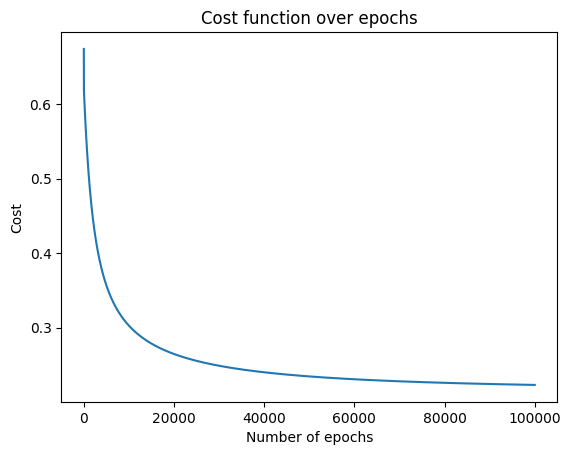

In [19]:
# Vẽ đồ thị biểu diễn cost
import matplotlib.pyplot as plt
plt.plot(costs)
plt.xlabel("Number of epochs")
plt.ylabel("Cost")
plt.title("Cost function over epochs")
plt.show()

### Tính toán độ chính xác

In [26]:
y_pred = predict(X, weights)
y_pred = classify(y_pred)

correct_records = 0
for i in range(n):
    if y_pred[i] == y[i]:
        correct_records += 1

accuracy = correct_records / n
accuracy

0.89

In [25]:
X_test = [[1,5,9], [1,2,6]] # 5: số giờ học, 9: số giờ ngủ
prediction = predict(X_test, weights)

print(prediction)

result = classify(prediction.reshape(-1,1)) # 1: pass, 0: fail
print(result)

[0.98878033 0.05482105]
[1, 0]
